## Part I: Exploratory Data Analysis

### Setup Environment

In [2]:
# import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [3]:
# mount google drive to load data
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# set dataset path
dataset_root = '/content/drive/MyDrive/Datasets/sepsis'
dataset_path = dataset_root + '/dataset.csv'

In [5]:
# load the raw dataset
sepsis_df = pd.read_csv(dataset_path)

In [6]:
# inspect
sepsis_df

,Unnamed: 0,Hour,HR,O2Sat,Temp,SBP,MAP,DBP,Resp,EtCO2,...,Fibrinogen,Platelets,Age,Gender,Unit1,Unit2,HospAdmTime,ICULOS,SepsisLabel,Patient_ID
0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,68.54,0,NaN,NaN,-0.02,1,0,17072
1,1,1,65.0,100.0,NaN,NaN,72.0,NaN,16.5,NaN,...,NaN,NaN,68.54,0,NaN,NaN,-0.02,2,0,17072
2,2,2,78.0,100.0,NaN,NaN,42.5,NaN,NaN,NaN,...,NaN,NaN,68.54,0,NaN,NaN,-0.02,3,0,17072
3,3,3,73.0,100.0,NaN,NaN,NaN,NaN,17.0,NaN,...,NaN,NaN,68.54,0,NaN,NaN,-0.02,4,0,17072
4,4,4,70.0,100.0,NaN,129.0,74.0,69.0,14.0,NaN,...,NaN,330.0,68.54,0,NaN,NaN,-0.02,5,0,17072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1552205,21,21,83.0,99.0,NaN,121.0,77.0,54.0,22.0,NaN,...,NaN,NaN,88.00,0,1.0,0.0,-2.93,22,0,113911
1552206,22,22,80.0,92.0,NaN,102.0,73.0,51.0,24.0,NaN,...,NaN,NaN,88.00,0,1.0,0.0,-2.93,23,0,113911
1552207,23,23,95.0,97.0,36.7,128.5,83.0,58.5,25.0,NaN,...,NaN,NaN,88.00,0,1.0,0.0,-2.93,24,0,113911
1552208,24,24,104.0,99.0,NaN,127.0,85.0,59.0,24.0,NaN,...,NaN,NaN,88.00,0,1.0,0.0,-2.93,25,0,113911


In [ ]:
# get the info
sepsis_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1552210 entries, 0 to 1552209
Data columns (total 44 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   Unnamed: 0        1552210 non-null  int64  
 1   Hour              1552210 non-null  int64  
 2   HR                1398811 non-null  float64
 3   O2Sat             1349474 non-null  float64
 4   Temp              525226 non-null   float64
 5   SBP               1325945 non-null  float64
 6   MAP               1358940 non-null  float64
 7   DBP               1065656 non-null  float64
 8   Resp              1313875 non-null  float64
 9   EtCO2             57636 non-null    float64
 10  BaseExcess        84145 non-null    float64
 11  HCO3              65028 non-null    float64
 12  FiO2              129365 non-null   float64
 13  pH                107573 non-null   float64
 14  PaCO2             86301 non-null    float64
 15  SaO2              53561 non-null    float64
 16  

In [8]:
# extract unique patients
unique_patient_ids = sepsis_df['Patient_ID'].unique()
print(f'Number of unique patients: {len(unique_patient_ids)}')

Number of unique patients: 40336


In [7]:
# helper function to get clinical variables only (plus patient ID)
def get_clinical_variables_df(df):
  return df.iloc[:, np.r_[2:36, 43]]

# helper function to get clinical variables only
def get_clinical_variables_df_with_target(df):
  return df.iloc[:, np.r_[2:36, 42, 43]]

# helper function to get clinical variables only
def get_nonclinical_variables_df_with_target(df):
  return df.iloc[:, 36:]

# helper function to get the clinical variables with
# consistent data (ie: not many NaNs) with base non-clinical features
def get_base_clinical_with_non_clinical(df):
  return df.iloc[:, np.r_[2:9, 36, 37, 42]]

# helper function to get the clinical variables with
# less consistent data (ie: many NaNs) with target.
# additional slice range added due to high number
def get_extended_clinical_with_non_clinical(df, range):
  return df.iloc[:, range]

# helper to extract and plot patient (randomly selected) clinicals
def visualize_clinicals_random_patient(df, patient_id):
  patient_df = df[df['Patient_ID'] == patient_id]
  clinical_patient_df = get_clinical_variables_df(patient_df)

  # plot stacked line
  plt.rcParams["figure.figsize"] = (12,30)
  ax = clinical_patient_df.plot(subplots=True, legend=True, title=f'Clinical data for Patient {patient_id}')[0]
  fig = ax.get_figure()
  fig.tight_layout()
  fig.subplots_adjust(top=0.95)
  plt.show()


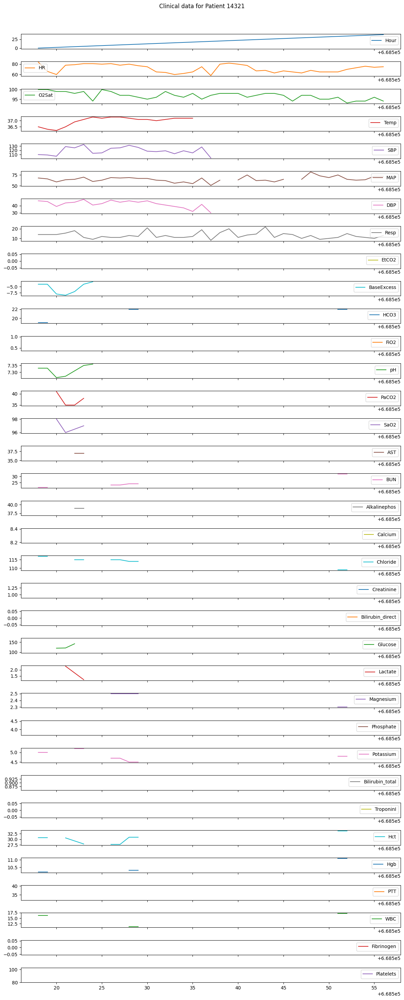

In [ ]:
# slice out just the clinical data to visualize
r_patient_id = np.random.choice(unique_patient_ids)
visualize_clinicals_random_patient(sepsis_df, r_patient_id)

### Visualize Distributions of the Clinical Variables
Plot the distributions of each of the clinical variables.  Many of these variables have a large NaN count, so this will help visualize the distributions of these.

In [ ]:
# slice to clinical data only
clinical_df = sepsis_df.iloc[:, 2:36]

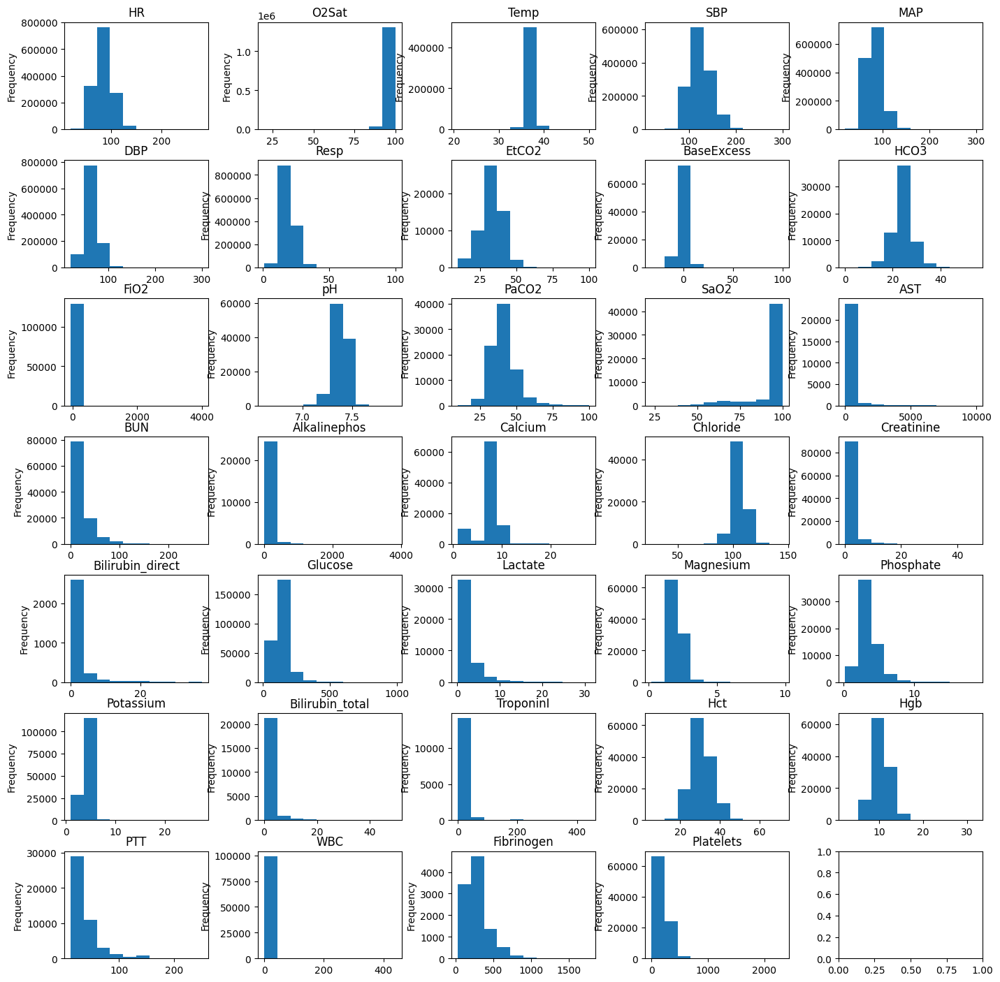

In [ ]:
# plot histograms of each clinical variable (across all patients)
plt.rcParams["figure.figsize"] = (14,14)
fig, axs = plt.subplots(7, 5)
fig.tight_layout()
for _,u in enumerate(clinical_df.columns):
    plt.subplot(7,5,_+1)
    clinical_df[u].plot(kind='hist')
    plt.title(u)
plt.show()

### Balances of Classes
We see in the visualizations below that we have significant class imbalances - partiularly with our target varaible.

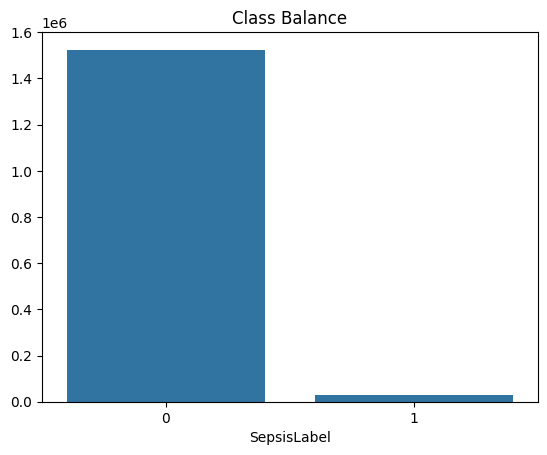

In [ ]:
# evaluate the class balance (has sepsis v not)
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
classes = sepsis_df['SepsisLabel'].value_counts()
sns.barplot(x=classes.index, y=classes.values)
plt.title('Class Balance')
plt.show()

### General Correlation between Variables
Evaluate correlation between variables through multiple visualizations including pairplot and correlation matrix.  The full dataset will be used in this case to evaluate potential correlations between variables.

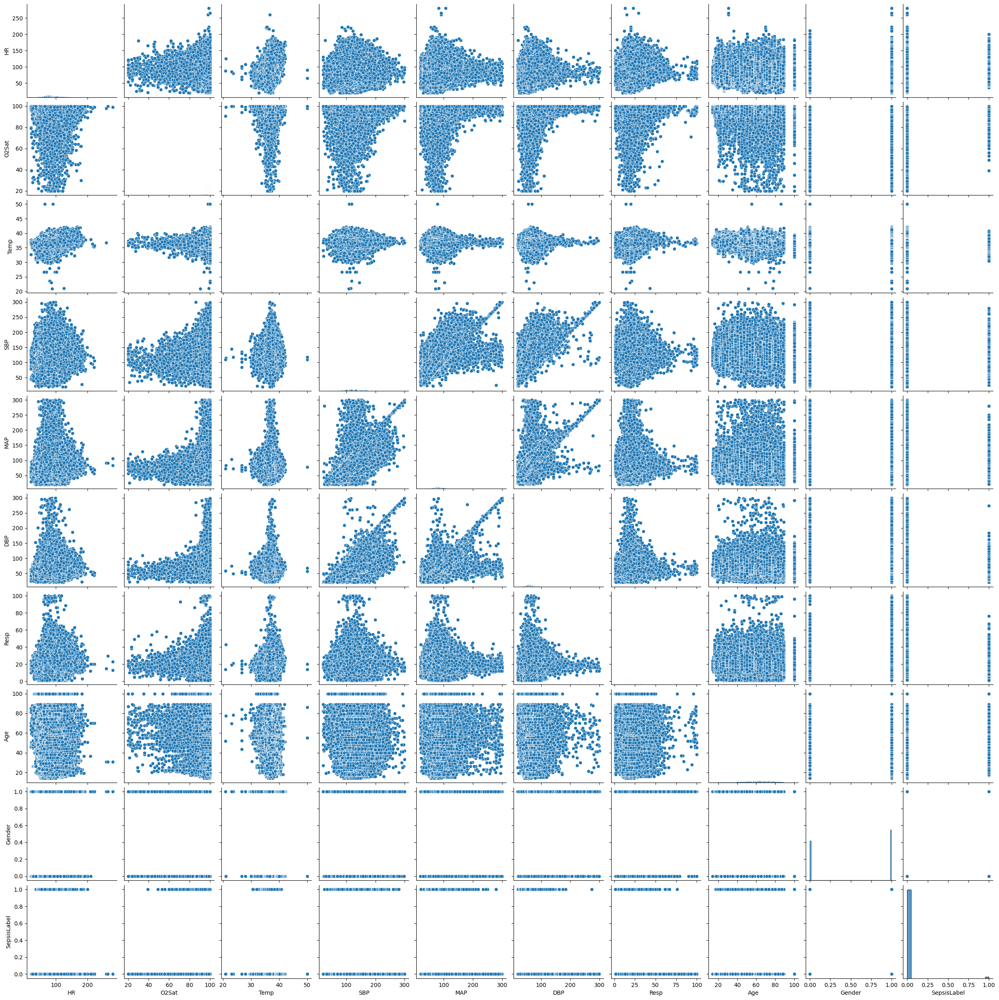

In [ ]:
# pair plot base clinical data v. target
base_clinical_df = get_base_clinical_with_non_clinical(sepsis_df)
vars = base_clinical_df.columns
sns.pairplot(base_clinical_df, vars=vars)
plt.show()

### Clinical Variables Pairplot Observations

This pairplot visualizes correlations between our base clinical variables (those that have consistent readings) and our non-clinical variabeles against our target.  We are able to observe some correlations between varianbles, and particularly between variables and our target varible.  Here are some of interest:

Correlation of input variables and target:
*   **O2 Sat**: There appears to be some positive correlation between increased O2 Sat and positive sepsis outcome.
*   **Temp**: Ignoring the outliers, there is a correlation between elevated temperature and positive sepsis outcome.
*   **DBP**: There is correlation between lower DBP and positive sepsis outcome.
*   **Resp**: There is weak positive correlation in lower resp values and positive sepsis outcome.
*   **Age**: There does not appear to be a correlation between age and sepsis outcome.

Correlation between input variables:
*   **DBP and SBP**: Observed linear correlation between these two.
*   **DBP and MAP**: Observed linear correlation between these two.
*   **MAP and SBP**: Observed linear correlation between these two.
*   **O2 Sat, DBP and SBP**: Observed correlation between these variables.
*   **Temp O2 Sat, DBP and SBP**: Observed correlation between these variables.




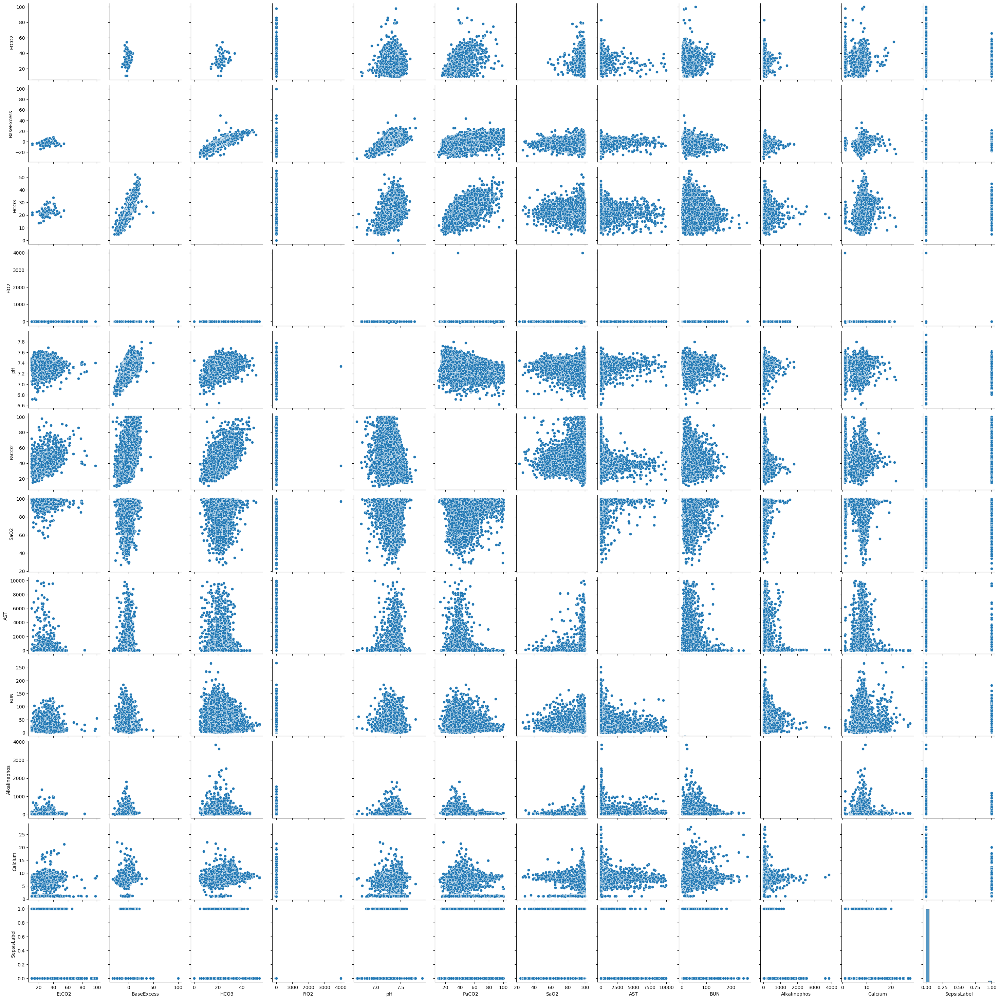

In [ ]:
# pair plot lab data v. target - batch 1
b1_range = np.r_[9:20, 42]

ext_clinical_df = get_extended_clinical_with_non_clinical(sepsis_df, b1_range)
vars = ext_clinical_df.columns
sns.pairplot(ext_clinical_df, vars=vars)
plt.show()

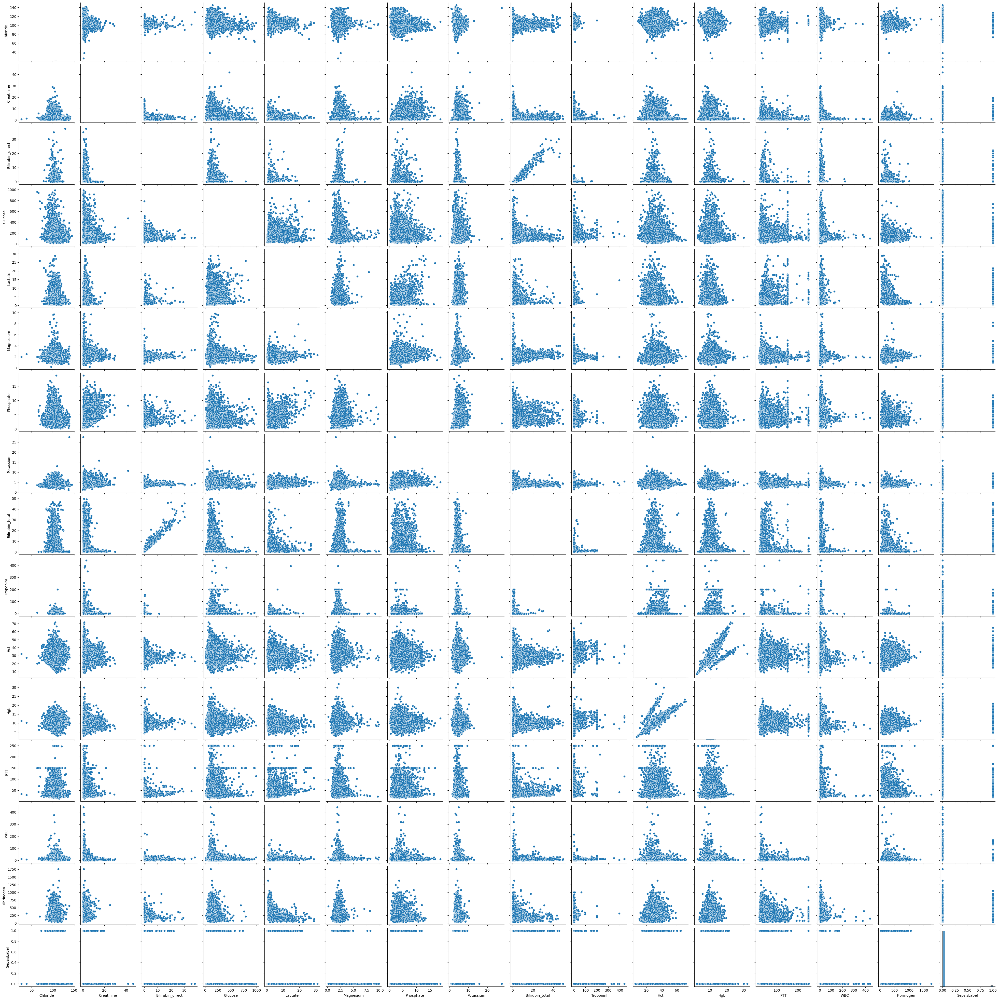

In [ ]:
# pair plot lab clinical data v. target - batch 2
b2_range = np.r_[20:35, 42]

ext_clinical_df = get_extended_clinical_with_non_clinical(sepsis_df, b2_range)
vars = ext_clinical_df.columns
sns.pairplot(ext_clinical_df, vars=vars)
plt.show()

### Interrogate Time Series Characteristics

Evaluate the time series by patient to determine:



1.   Is the timeline consistent across all patients?
2.   If so, what is the window and timestep?
3.   If not, how much do the windows vary?



In [47]:
# helper function to build timeseries stats by patient
def compile_patient_stats_df():
  patient_ts_stats = []
  for patient_id in unique_patient_ids:
    # get max values
    max_hour = sepsis_df[sepsis_df['Patient_ID'] == patient_id]['Hour'].max()
    max_adm_time = sepsis_df[sepsis_df['Patient_ID'] == patient_id]['HospAdmTime'].min() # its negative hours
    sepsis_label = sepsis_df[sepsis_df['Patient_ID'] == patient_id]['SepsisLabel'].max()

    # get ts values
    patient_records = sepsis_df[sepsis_df['Patient_ID'] == patient_id]
    num_time_steps = len(patient_records)
    time_step_sepsis = -1
    time_step_clinicals = -1
    time_step_labs_start = -1
    time_step_labs_last = -1
    total_labs = 0
    for i in range(len(patient_records)):
      if patient_records.iloc[i]['SepsisLabel'] == 1:
        time_step_sepsis = i
      if patient_records.iloc[i]['HR'] > 0:
        time_step_clinicals = i
      if time_step_labs_start == -1 and patient_records.iloc[i]['WBC'] > 0:
        time_step_labs_start = i
      if patient_records.iloc[i]['WBC'] > 0:
        if time_step_labs_start == -1:
          time_step_labs_start = i
        time_step_labs_last = i
        total_labs += 1

    patient_ts_stats.append([patient_id, max_hour, max_adm_time, sepsis_label, num_time_steps, time_step_sepsis, time_step_clinicals, time_step_labs_start, time_step_labs_last, total_labs])

  # convert to dataframe
  patient_stats_cols = ['patient_id', 'max_hour', 'max_adm_time', 'sepsis_label', 'num_time_steps', 'time_step_sepsis', 'time_step_clinicals', 'time_step_labs_start', 'time_step_labs_last', 'total_labs']
  patient_stats = pd.DataFrame(data=patient_ts_stats, columns=patient_stats_cols)
  return patient_stats

# helper function to print descriptive stats
def print_descriptive_stats(df, column_name):
  print(f"[{column_name}] Min: {df[column_name].min()}")
  print(f"[{column_name}] Max: {df[column_name].max()}")
  print(f"[{column_name}] Mean: {round(df[column_name].mean(), 2)}")
  print(f"[{column_name}] Std Dev: {round(df[column_name].std(), 2)}")

In [35]:
# create a dataframe from the stats
sepsis_ts_stats = compile_patient_stats_df()

In [36]:
# interrogate
sepsis_ts_stats

,patient_id,max_hour,max_adm_time,sepsis_label,num_time_steps,time_step_sepsis,time_step_clinicals,time_step_labs_start,time_step_labs_last,total_labs
0,17072,42,-0.02,0,43,-1,42,4,37,3
1,16153,15,-0.04,0,16,-1,15,4,4,1
2,465,35,-0.03,0,36,-1,34,13,24,2
3,9891,35,-2.43,0,36,-1,35,13,24,2
4,8065,45,-0.01,0,46,-1,45,1,32,3
...,...,...,...,...,...,...,...,...,...,...
40331,104763,37,-2.74,0,38,-1,37,5,28,2
40332,118556,14,-5.94,0,15,-1,11,1,1,1
40333,105149,17,-4.09,0,18,-1,10,3,3,1
40334,112699,16,-153.99,0,17,-1,16,7,7,1


In [37]:
# write to storage (since it takes a long time to process)
sepsis_ts_stats.to_csv(dataset_root + '/patient_ts_stats.csv')

In [45]:
# break up the positive and negative sepsis cases
sepsis_ts_stats_pos = sepsis_ts_stats[sepsis_ts_stats['sepsis_label'] == 1]
sepsis_ts_stats_neg = sepsis_ts_stats[sepsis_ts_stats['sepsis_label'] == 0]

#### Analyze time series - how many time steps for each patient


In [48]:
# descriptive statistics - full dataset
print_descriptive_stats(sepsis_ts_stats, 'num_time_steps')

[num_time_steps] Min: 8
[num_time_steps] Max: 336
[num_time_steps] Mean: 38.48
[num_time_steps] Std Dev: 22.8


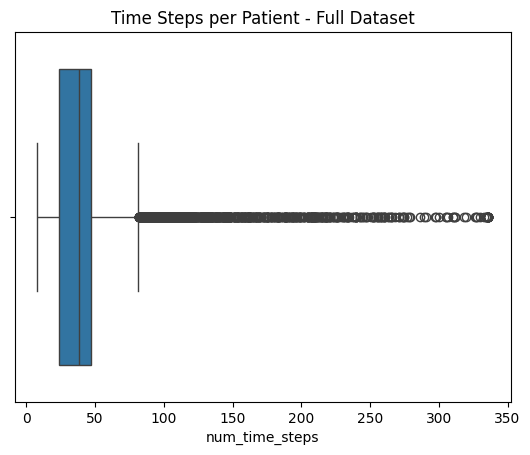

In [52]:
# visualize in box plot
sns.boxplot(x=sepsis_ts_stats['num_time_steps']).set_title('Time Steps per Patient - Full Dataset')
plt.show()

In [49]:
#descriptive statistics - positive cases only
print_descriptive_stats(sepsis_ts_stats_pos, 'num_time_steps')

[num_time_steps] Min: 8
[num_time_steps] Max: 336
[num_time_steps] Mean: 58.8
[num_time_steps] Std Dev: 59.18


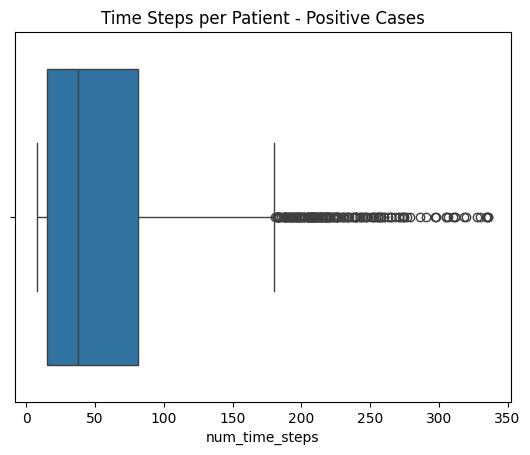

In [54]:
# visualize in box plot
sns.boxplot(x=sepsis_ts_stats_pos['num_time_steps']).set_title('Time Steps per Patient - Positive Cases')
plt.show()

#### Analyze which timestep sepsis is detected for positive patients


In [55]:
#descriptive statistics - positive cases only
print_descriptive_stats(sepsis_ts_stats_pos, 'time_step_sepsis')

[time_step_sepsis] Min: 7
[time_step_sepsis] Max: 335
[time_step_sepsis] Mean: 57.8
[time_step_sepsis] Std Dev: 59.18


**Analysis Notes**: Based on the descriptive statistics, it appears that each time series (per patient) for positive outcomes ends at the point which the patient is diagnosed with sepsis.  So, the last time step/sample is the only one with a positive outcome.

#### Analyize when the first lab samples are typically taken and how many

In [57]:
#descriptive statistics - full dataset
print_descriptive_stats(sepsis_ts_stats, 'time_step_labs_start')

[time_step_labs_start] Min: -1
[time_step_labs_start] Max: 248
[time_step_labs_start] Mean: 6.98
[time_step_labs_start] Std Dev: 6.99


In [56]:
#descriptive statistics - positive cases only
print_descriptive_stats(sepsis_ts_stats_pos, 'time_step_labs_start')

[time_step_labs_start] Min: -1
[time_step_labs_start] Max: 108
[time_step_labs_start] Mean: 5.62
[time_step_labs_start] Std Dev: 6.54


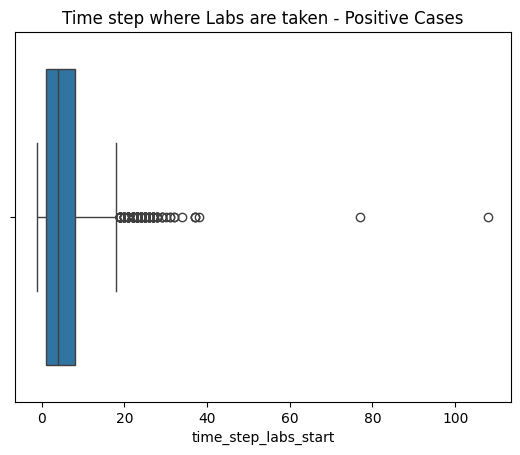

In [58]:
# visualize in box plot
sns.boxplot(x=sepsis_ts_stats_pos['time_step_labs_start']).set_title('Time step where Labs are taken - Positive Cases')
plt.show()

In [65]:
# check number of labs for all cases
print_descriptive_stats(sepsis_ts_stats, 'total_labs')

[total_labs] Min: 0
[total_labs] Max: 83
[total_labs] Mean: 2.47
[total_labs] Std Dev: 2.23


In [64]:
# check number of labs for positive cases
print_descriptive_stats(sepsis_ts_stats_pos, 'total_labs')

[total_labs] Min: 0
[total_labs] Max: 52
[total_labs] Mean: 4.34
[total_labs] Std Dev: 4.8


In [66]:
# check number of positive cases without labs
print(f"Number of positive sepsis outcomes without lab samples: {len(sepsis_ts_stats_pos[sepsis_ts_stats_pos['total_labs'] == 0])} out of {len(sepsis_ts_stats_pos)} total.")

Number of positive sepsis outcomes without lab samples: 242 out of 2932 total.


In [68]:
# check number of negative cases without labs
print(f"Number of negative sepsis outcomes without lab samples: {len(sepsis_ts_stats_neg[sepsis_ts_stats_neg['total_labs'] == 0])} out of {len(sepsis_ts_stats_neg)} total.")

Number of negative sepsis outcomes without lab samples: 2383 out of 37404 total.
